# Airbnb Guest Satisfaction Prediction

- Rapeewit Chanprakaisi
- Renata Lovette
- Angelyca Purewal
- Yingqian Shi

STAT 301

April 12th, 2024

## Introduction

Start with relevant background information on the topic to prepare those unfamiliar for the rest of your proposal. Motivate the question you are about to add.

Formulate one or two questions for investigation indicating if the primary goal is inference or prediction. Make sure that the question(s) can be answer with the data available. For example, you won't be able to quantify the "effect of X on Y" or "the influence of X on Y" or "how X affects Y" using the methods learned in class and observational data.

If available, align your question/objectives with the existing literature on the topic. You can add a reference to a scientific publication if available and listed in the References section (not mandatory). 

### QUESTION
Using this dataset, I aim to develop a model to figure out if I can predict guest satisfaction based on factors such as listing price, city (e.g., London, Rome, Budapest), location characteristics (e.g., latitude/longitude, distance from the city center), and Airbnb listing type (e.g., room type, business listing, multiple rooms or not).

#### Response Variable:
guest_satisfaction_overall

#### Primary Focus
My question is focused on prediction because I am interested in understanding the relationship between all my variables and how they relate to and cause Airbnb guest satisfaction levels. I want to use my model to predict guest satisfaction based on multiple variables.

## Methods and Results

In [1]:
library(tidyverse)
library(repr)
library(ggplot2)
library(patchwork)
library(caret)
library(glmnet)
library(rsample)
library(car)
options(repr.plot.width = 16, repr.plot.height = 10)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:purrr’:

    lift


Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4.1-8

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:pu

### Data

#### Data Description

The data set used in this project is called Airbnb Prices in European Cities. This data provides Airbnb listings from popular European cities which are evaluated across 22 variables. These variables include:

- id: Observation ID [Numerical - Discrete]
- realSum: The full price of the listing in EUR [Numerical - Continuous]
- room_type: Categorizes the room type of the Airbnb as either Private Room, Shared Room, or Entire Home/Apt [Categorical]
- room_shared: Indicates whether the room is shared (TRUE/FALSE) [Boolean/Binary]
- room_private: Indicates whether the room is private (TRUE/FALSE) [Boolean/Binary]
- person_capacity: Maximum number of guests allowed [Numerical - Discrete]
- host_is_superhost: Indicates whether the host has superhost status (TRUE/FALSE) [Boolean/Binary]
- multi: Differentiates whether the listing is for multiple rooms (0 = No, 1 = Yes) [Boolean/Binary]
- biz: Indicates if the listing is for business purposes (0 = No, 1 = Yes) [Boolean/Binary]
- cleanliness_rating: The cleanliness rating of the Airbnb listing [Numerical - Continuous]
- guest_satisfaction_overall: The overall rating of the listing [Numerical - Continuous]
- bedrooms: Number of bedrooms in the listing (0 for studios) [Numerical - Discrete]
- dist: Distance from the city center in km [Numerical - Continuous]
- metro_dist: The distance of the listing from the nearest metro station in km [Numerical - Continuous]
- attr_index: The attraction index of the listing location [Numerical - Continuous]
- attr_index_norm: The normalized attraction index (0-100) [Numerical - Continuous]
- rest_index: The restaurant index of the listing location [Numerical - Continuous]
- rest_index_norm: The normalized restaurant index (0-100) [Numerical - Continuous]
- lng: Longitude of the listing location [Numerical - Continuous]
- lat: Latitude of the listing location [Numerical - Continuous]
- city: The city in which the listing is located (London, Rome, Budapest) [Categorical]
- time: The time of the week of the listing (Weekend, Weekday) [Categorical]

After combining 6 smaller sets of data from London, Budapest and Rome, using both weekend and weekday data we created a combined dataset with a total number of 23,042 observations.

#### Source and information
The data source and citation as requested by the owner(s) is
> Gyódi, K., & Nawaro, Ł. (2021). Determinants of Airbnb prices in European cities: A spatial econometrics approach (Supplementary Material) [Data set]. Zenodo. https://doi.org/10.5281/zenodo.4446043

#### Data collection
The data has been collected using spatial econometric methods to analyse and identify the determinants of Airbnb prices across these cities.

#### Pre-selection of variables
For my analysis project I excluded the following variables: rest_index, attr_index, room_shared and room_private. I removed rest_index and attr_index as their normalized versions which are included in the dataset, provide a more meaningful and standardized measure, making the raw versions redundant. I also omitted room_shared and room_private since the variable room_type already categorizes the listing into private, shared, or entire home/apt, making these additional classifications unnecessary for my analysis. It is also not clear if the room_privite and room_shared variables were classifying a different aspect of the room and therefore I assumed it was covering the same information. I also chose to remove the categorical level of room_type = "Shared room" because the number of observations that fit into this category is significantly smaller than the other categories of room_type = "Private room" and room_type = "Entire home/apt". Therefore if I kept this data in the dataset I could end up in a situation where when I split the data into training and testing all the "Shared room" observations might fall into the testing set and my model would not recognize these points.

#### Read Data

In [2]:
# Loading in the 6 data sets 
budapest_weekdays <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/budapest_weekdays.csv")
budapest_weekends <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/budapest_weekends.csv")
london_weekdays <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/london_weekdays.csv")
london_weekends <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/london_weekends.csv")
rome_weekdays <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/rome_weekdays.csv")
rome_weekends <- read_csv("https://raw.githubusercontent.com/rchanpra/stat-301-project/refs/heads/main/data/rome_weekends.csv")

head(budapest_weekdays)

New names:
• `` -> `...1`
Rows: 2074 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): room_type
dbl (16): ...1, realSum, person_capacity, multi, biz, cleanliness_rating, gu...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 1948 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): room_type
dbl (16): ...1, realSum, person_capacity, multi, biz, cleanliness_rating, gu...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 4614 Columns: 20
── Column specification ─────────────────

...1,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat
<dbl>,<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,238.9905,Entire home/apt,FALSE,FALSE,6,TRUE,0,1,10,99,1,0.3593550,0.3526430,404.4047,24.116552,893.4773,67.65685,19.05074,47.50076
1,300.7943,Entire home/apt,FALSE,FALSE,6,FALSE,0,1,9,98,2,0.9294272,0.2002355,1676.8760,100.000000,452.5397,34.26770,19.04493,47.50405
2,162.3819,Entire home/apt,FALSE,FALSE,4,TRUE,0,0,10,98,1,2.4508403,0.2794518,163.5885,9.755551,191.9923,14.53825,19.02170,47.49882
3,118.4377,Entire home/apt,FALSE,FALSE,2,FALSE,0,0,9,92,1,1.5594494,0.4779711,191.7198,11.433155,326.2156,24.70205,19.06301,47.51126
4,134.4174,Entire home/apt,FALSE,FALSE,4,TRUE,1,0,10,99,2,1.1138030,0.2701016,198.6035,11.843658,635.5159,48.12322,19.06900,47.49900
5,127.3676,Entire home/apt,FALSE,FALSE,4,FALSE,1,0,9,91,2,0.2684703,0.1669317,635.6350,37.905903,1005.6535,76.15118,19.05480,47.50094


### Exploratory Data Analysis (EDA)

#### Clean and wrangle data

In [3]:
# Adding two new columns to each of the datasets 
budapest_weekdays_data <- budapest_weekdays %>% mutate(city = "Budapest", time = "Weekday")
budapest_weekends_data <- budapest_weekends %>% mutate(city = "Budapest", time = "Weekend") 
london_weekdays_data <- london_weekdays %>% mutate(city = "London", time = "Weekday")
london_weekends_data <- london_weekends %>% mutate(city = "London", time = "Weekend") 
rome_weekdays_data <- rome_weekdays %>% mutate(city = "Rome", time = "Weekday")
rome_weekends_data <- rome_weekends %>% mutate(city = "Rome", time = "Weekend") 

# Combining all the data sets into a tidy format
airbnb_data <- bind_rows(budapest_weekdays_data, budapest_weekends_data, london_weekdays_data, london_weekends_data, rome_weekdays_data, rome_weekends_data) %>% rename(id = ...1)

airbnb_data <- airbnb_data %>% mutate(room_shared = ifelse(toupper(room_shared) == "TRUE", 1, 0),
                    room_private = ifelse(toupper(room_private) == "TRUE", 1, 0),
                    host_is_superhost = ifelse(toupper(host_is_superhost) == "TRUE", 1, 0))

airbnb_data <- airbnb_data %>% filter(room_type != "Shared room") %>% select(-rest_index, -attr_index, -room_shared, -room_private)

head(airbnb_data)

id,realSum,room_type,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index_norm,rest_index_norm,lng,lat,city,time
<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
0,238.9905,Entire home/apt,6,1,0,1,10,99,1,0.3593550,0.3526430,24.116552,67.65685,19.05074,47.50076,Budapest,Weekday
1,300.7943,Entire home/apt,6,0,0,1,9,98,2,0.9294272,0.2002355,100.000000,34.26770,19.04493,47.50405,Budapest,Weekday
2,162.3819,Entire home/apt,4,1,0,0,10,98,1,2.4508403,0.2794518,9.755551,14.53825,19.02170,47.49882,Budapest,Weekday
3,118.4377,Entire home/apt,2,0,0,0,9,92,1,1.5594494,0.4779711,11.433155,24.70205,19.06301,47.51126,Budapest,Weekday
4,134.4174,Entire home/apt,4,1,1,0,10,99,2,1.1138030,0.2701016,11.843658,48.12322,19.06900,47.49900,Budapest,Weekday
5,127.3676,Entire home/apt,4,0,1,0,9,91,2,0.2684703,0.1669317,37.905903,76.15118,19.05480,47.50094,Budapest,Weekday


In [4]:
cat('\nData has', sum(is.na(airbnb_data)), 'rows with missing values.')


Data has 0 rows with missing values.

#### Visualization

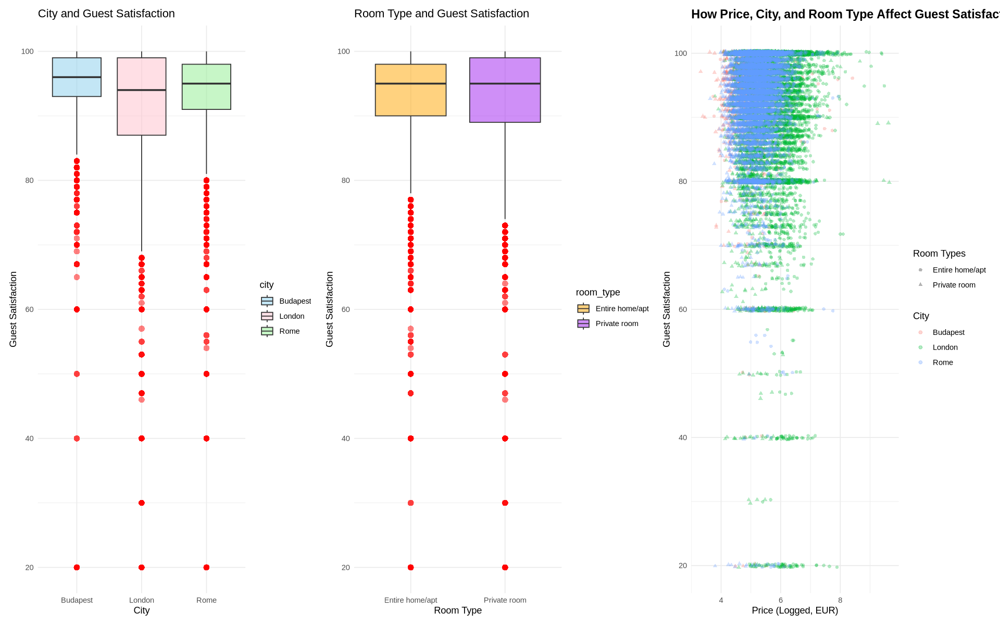

In [5]:
scatter_plot <- ggplot(airbnb_data, aes(x = log(realSum), y = guest_satisfaction_overall, color = city , shape= room_type)) + 
# I have logged realSum (the price of the Airbnb listing) because this variable has extreme values therefore 
# applying the log function will compress large values while maintaining the overall trends
  geom_jitter(alpha = 0.3, width = 0.3, height = 0.3) + # jitter is used in order to spread some of the points and reduce overlapping
#I set alpha to 0.3 because lowering the alpha (opacity) makes denser areas more visible
  labs(x = "Price (Logged, EUR)", 
       y = "Guest Satisfaction", 
       color = "City", 
       shape= "Room Types",
      title = "How Price, City, and Room Type Affect Guest Satisfaction") +
      theme_minimal() +
      theme(legend.position = "right", 
      plot.title = element_text(size = 14, face = "bold"))


box_plot <- ggplot(airbnb_data, aes(x = city, y = guest_satisfaction_overall, fill = city)) +
  geom_boxplot(outlier.shape = 16, outlier.colour = "red", outlier.size = 3, alpha = 0.5) +  
  labs(x = "City", y = "Guest Satisfaction", title = "City and Guest Satisfaction") +
  theme_minimal() +
  scale_fill_manual(values = c("skyblue", "pink", "lightgreen"))

box_plot2 <- ggplot(airbnb_data, aes(x = room_type, y = guest_satisfaction_overall, fill = room_type)) +
  geom_boxplot(outlier.shape = 16, outlier.colour = "red", outlier.size = 3, alpha = 0.5) +  
  labs(x = "Room Type", y = "Guest Satisfaction", title = "Room Type and Guest Satisfaction") +
  scale_fill_manual(values = c("orange", "purple")) + 
  theme_minimal()

box_plot + box_plot2 + scatter_plot 

#### Visualization Explanation
I have created a scatterplot to explore all 4 of my variables, and then two box plots to explore the relationship between my categorical variables and guest satisfaction. I believe these are relevant as the box plots show that the median guest satisfaction is different for each city but there is a lot of overlap and my other box plot shows that my two room types have very similar medians and overlap a lot, this tells me how much each variable plays a role in guest satisfaction. The scatterplot gives me a big picture of what is going on in my data. I had a lot of overlap so I can draw insight from that.

### Methods: Plan

#### Why is this method appropriate?
To develop a predictive model for guest satisfaction, a continuous variable, I will use predictors such as the price of the listing, city (e.g., London, Rome, Budapest), location (e.g., city center distance), and listing characteristics (e.g., room type, business suitability, number of rooms). Lasso regression will be used, as it is particularly well-suited for this task by penalizing large coefficients, thus improving model interpretability and generalizability. Before applying Lasso, I will check for multicollinearity using Variance Inflation Factor (VIF). VIF values higher than 5 or 10 suggest multicollinearity issues that might require addressing. After checking VIF, I will split the data into a training set (80%) and a testing set (20%). The training data will be standardized and used to fit the Lasso regression model via the glmnet function. I will select the optimal lambda (penalty term) through cross-validation. Finally, I will evaluate the model's performance using the testing set and assess its prediction accuracy, particularly by computing the Root Mean Squared Error (RMSE).

#### Which assumptions are required, if any, to apply the method selected?

To use an MLR model I need to assume the following: 

* Linearity: The relationship between the dependent variable (guest_satisfaction_overall) and each independent variable should be linear. 
* Independence: Observations should be independent of each other. 
* Homoscedasticity: The variance of residuals should remain constant across predictions.
* Normality of Residuals: Residuals should follow a normal distribution 
* No extreme outliers  

#### What are the potential limitations or weaknesses of the method selected?

Potential Limitations:

* Airbnb guest satisfaction ratings tend to cluster around high values and values that are multiples of 10. Leading to a skewed distribution of the response variable. This may violate normality assumptions. 
* Multicollinearity: Some predictors (e.g., location-based features) might be highly correlated, requiring ridge or lasso regression to improve model stability. Multicollinearity occurs when there is a strong association between two or more covariates. These covariates bring similar information to the model, and we have trouble isolating their effect. 

Lasso will be used to mitage the previous limitation however this method adds its on limitations to the mix.
* Lasso can shrink coefficients of predictors too much, sometimes pushing important predictors to zero. This could result in an overly simplified model, losing useful information for prediction or interpretation.
* Lasso introduces bias into the model coefficients, especially for highly correlated predictors. While this helps in reducing overfitting, it can distort the true relationship between predictors and the outcome.
* Lasso assumes a linear relationship and does not automatically account for interaction terms between predictors. If there are important interactions, Lasso may not capture them unless explicitly included in the model.


In [6]:
# Set seed for reproducibility
set.seed(123)

# Split the data into training (80%) and testing (20%) sets
airbnb_split <- 
    airbnb_data %>%
    initial_split(prop = 0.8, strata = guest_satisfaction_overall)

train_data <- training(airbnb_split)
test_data <- testing(airbnb_split)

#I will now conduct further pre selection of variables. I will remove ID to prevent non-informative columns from affecting the model. 
#I will also remove the columns lng and lat because we you haven't learned how to use spatial analysis variables.

train_data <- train_data %>% select(-id, -lng, -lat)
test_data <- test_data %>% select(-id, -lng, -lat)


In [7]:
## I will conduct an initial check for multicollinearity using VIF. Values higher than 5 or 10 suggests multicollinearity might be problematic.
mlr_model <- lm(guest_satisfaction_overall ~ ., data = train_data)  # Fit model with all predictors
vif(mlr_model)
## I have found low to moderate multicollinearity therefore I will use Lasso for further variable selection.

,GVIF,Df,GVIF^(1/(2*Df))
realSum,1.284730,1,1.133459
room_type,1.723590,1,1.312856
person_capacity,2.159657,1,1.469577
host_is_superhost,1.134051,1,1.064918
multi,1.432741,1,1.196971
biz,1.560875,1,1.249350
cleanliness_rating,1.120349,1,1.058465
bedrooms,1.591706,1,1.261628
dist,4.494504,1,2.120025
metro_dist,1.880566,1,1.371337


### COMPUTATIONAL CODE AND OUTPUT

[1] "RMSE (Lasso): 6.128"


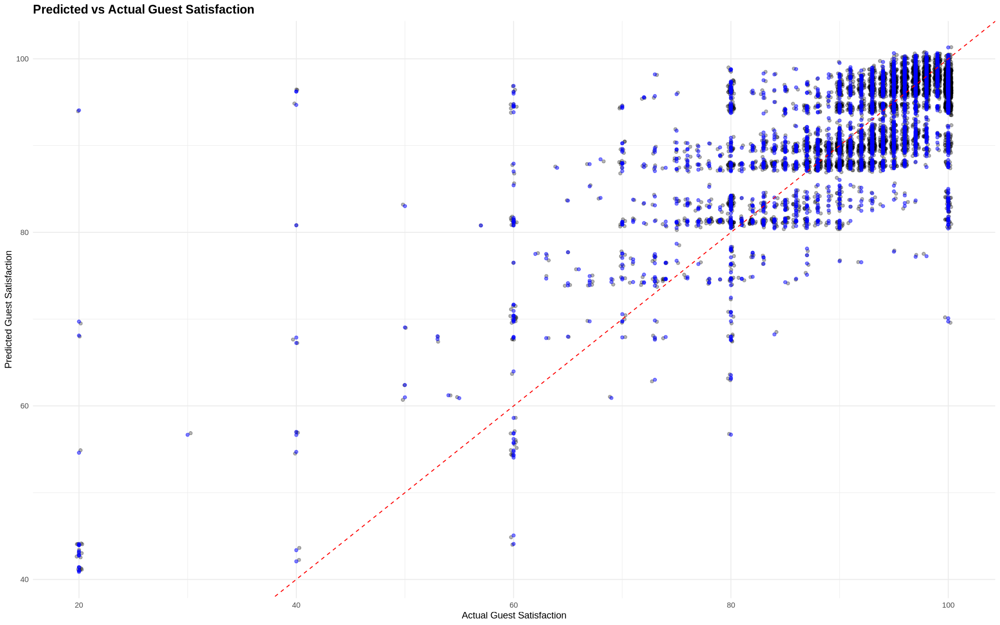

In [8]:
X_train <- model.matrix(guest_satisfaction_overall ~ ., data = train_data)[, -1]  # Remove intercept
y_train <- train_data$guest_satisfaction_overall
X_test <- model.matrix(guest_satisfaction_overall ~ ., data = test_data)[, -1]

# Standardize predictors
X_train_scaled <- scale(X_train)
X_test_scaled <- scale(X_test, center = attr(X_train_scaled, "scaled:center"), scale = attr(X_train_scaled, "scaled:scale"))

# Perform Lasso Regression with cross-validation
cv_lasso <- cv.glmnet(X_train_scaled, y_train, alpha = 1)  # Lasso (alpha = 1)

# Get the best lambda
best_lambda_lasso <- cv_lasso$lambda.min

# Train the final Lasso model
lasso_model <- glmnet(X_train_scaled, y_train, alpha = 1, lambda = best_lambda_lasso)

# Predict on the test set
lasso_preds <- predict(lasso_model, s = best_lambda_lasso, newx = X_test_scaled)

# Compute RMSE for Lasso
rmse_lasso <- sqrt(mean((lasso_preds - test_data$guest_satisfaction_overall)^2))

# Print RMSE
print(paste("RMSE (Lasso):", round(rmse_lasso, 3)))

# Create a data frame with actual and predicted values
prediction_data <- data.frame(Actual = test_data$guest_satisfaction_overall, 
                              s1 = lasso_preds)

#Scatter plot: Predicted vs Actual
plot <- ggplot(prediction_data, aes(x = Actual, y = s1)) +
  geom_jitter(alpha = 0.3, width = 0.3, height = 0.3) + # jitter is used in order to spread some of the points and reduce overlapping
  geom_point(color = "blue", alpha = 0.5) +  # Points for Predicted vs Actual values
  geom_abline(slope = 1, intercept = 0, color = "red", linetype = "dashed") +  # Line of perfect prediction
  labs(title = "Predicted vs Actual Guest Satisfaction", 
       x = "Actual Guest Satisfaction", 
       y = "Predicted Guest Satisfaction") +
  theme_minimal() +
  theme(legend.position = "right", 
  plot.title = element_text(size = 14, face = "bold"))

plot



#### Visualization Interpretation

If this model was perfect all points would fall on the red line, instead we have a spread around the line, indicating prediction error. This model predicts high guest satisfaction fairly well, because most of our training data consited of higher ratings, which is also why this model struggles to predict low satisfaction scores often overestimating them. The predictions are also compressed toward the average, a common effect of Lasso regression shrinking extreme values. To improve, I would need to adress the imbalance in low-rated listings.


## Discussion

- Summarize what you found and the implications/impact of your findings
- If relevant, discuss whether your results were what you expected to find
- Discuss how your model could be improved
- Discuss future questions/research this study could lead to

## References

Airbnb prices in European cities. (2024, March 10). Kaggle. https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities

Gyódi, K., & Nawaro, Ł. (2021). Determinants of Airbnb prices in European cities: A spatial econometrics approach (Supplementary Material) [Dataset]. In Zenodo (CERN European Organization for Nuclear Research). https://doi.org/10.5281/zenodo.4437019
